In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import os



**DATA Importing and understanding**

In [2]:
df = pd.read_csv('realtor-data.csv')
df.head(10)

,status,price,bed,bath,acre_lot,full_address,street,city,state,zip_code,house_size,sold_date
0,for_sale,105000.0,3.0,2.0,0.12,"Sector Yahuecas Titulo # V84, Adjuntas, PR, 00601",Sector Yahuecas Titulo # V84,Adjuntas,Puerto Rico,601.0,920.0,NaN
1,for_sale,80000.0,4.0,2.0,0.08,"Km 78 9 Carr # 135, Adjuntas, PR, 00601",Km 78 9 Carr # 135,Adjuntas,Puerto Rico,601.0,1527.0,NaN
2,for_sale,67000.0,2.0,1.0,0.15,"556G 556-G 16 St, Juana Diaz, PR, 00795",556G 556-G 16 St,Juana Diaz,Puerto Rico,795.0,748.0,NaN
3,for_sale,145000.0,4.0,2.0,0.10,"R5 Comunidad El Paraso Calle De Oro R-5 Ponce,...",R5 Comunidad El Paraso Calle De Oro R-5 Ponce,Ponce,Puerto Rico,731.0,1800.0,NaN
4,for_sale,65000.0,6.0,2.0,0.05,"14 Navarro, Mayaguez, PR, 00680",14 Navarro,Mayaguez,Puerto Rico,680.0,NaN,NaN
5,for_sale,179000.0,4.0,3.0,0.46,"Bo Calabazas San Sebastian, San Sebastian, PR,...",Bo Calabazas San Sebastian,San Sebastian,Puerto Rico,612.0,2520.0,NaN
6,for_sale,50000.0,3.0,1.0,0.20,"49.1 140, Ciales, PR, 00639",49.1 140,Ciales,Puerto Rico,639.0,2040.0,NaN
7,for_sale,71600.0,3.0,2.0,0.08,"3467 St, Ponce, PR, 00731",3467 St,Ponce,Puerto Rico,731.0,1050.0,NaN
8,for_sale,100000.0,2.0,1.0,0.09,"230 Rio De Vida, Ponce, PR, 00730",230 Rio De Vida,Ponce,Puerto Rico,730.0,1092.0,NaN
9,for_sale,300000.0,5.0,3.0,7.46,"Pr 120 Bo Maravilla Sur K M # 335, Las Marias,...",Pr 120 Bo Maravilla Sur K M # 335,Las Marias,Puerto Rico,670.0,5403.0,NaN


In [3]:
df.shape

(733159, 12)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 733159 entries, 0 to 733158
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   status        733159 non-null  object 
 1   price         733088 non-null  float64
 2   bed           617177 non-null  float64
 3   bath          621407 non-null  float64
 4   acre_lot      572378 non-null  float64
 5   full_address  733159 non-null  object 
 6   street        732069 non-null  object 
 7   city          733087 non-null  object 
 8   state         733159 non-null  object 
 9   zip_code      732957 non-null  float64
 10  house_size    520772 non-null  float64
 11  sold_date     347237 non-null  object 
dtypes: float64(6), object(6)
memory usage: 67.1+ MB


In [5]:
df.describe()

,price,bed,bath,acre_lot,zip_code,house_size
count,7.330880e+05,617177.000000,621407.000000,572378.000000,732957.000000,5.207720e+05
mean,7.257017e+05,3.422041,2.540473,19.058585,5736.101623,2.192527e+03
std,1.768769e+06,2.028735,2.002442,1022.007111,3764.935565,3.141461e+03
min,0.000000e+00,1.000000,1.000000,0.000000,601.000000,1.000000e+02
25%,2.375000e+05,2.000000,2.000000,0.140000,2492.000000,1.195000e+03
50%,4.190000e+05,3.000000,2.000000,0.350000,6001.000000,1.714000e+03
75%,7.250000e+05,4.000000,3.000000,1.380000,7928.000000,2.547250e+03
max,8.750000e+08,123.000000,198.000000,100000.000000,99999.000000,1.450112e+06


In [6]:
df.describe(include = 'object')

,status,full_address,street,city,state,sold_date
count,733159,733159,732069,733087,733159,347237
unique,2,103681,102076,2438,18,9803
top,for_sale,"4 Glen Ellen Blvd, Millis, MA, 02054",4 Glen Ellen Blvd,Boston,New Jersey,2022-01-21
freq,731566,213,213,31502,191280,251


**DATA PREPROCESSING**

Dropping the duplicates

In [7]:
df.duplicated().sum()

628490

In [8]:
df.drop_duplicates(inplace=True)

Missing Values

In [9]:
total_missing = df.isna().sum()*100/len(df)
print('Percentage Missing Value %')
total_missing

Percentage Missing Value %


status           0.000000
price            0.017197
bed             15.683727
bath            15.077052
acre_lot        25.023646
full_address     0.000000
street           0.354451
city             0.021019
state            0.000000
zip_code         0.029617
house_size      31.482101
sold_date       47.919632
dtype: float64

In [10]:
# Mode imputation to handle missing value
df['bed'].fillna(df['bed'].mode()[0], inplace=True)
df['bath'].fillna(df['bath'].mode()[0], inplace=True)
df['acre_lot'].fillna(df['acre_lot'].mode()[0], inplace=True)
df['house_size'].fillna(df['house_size'].mode()[0], inplace=True)

In [15]:
df = df.dropna(subset=['zip_code','city'])
df = df.drop('sold_date', axis=1)

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 104631 entries, 0 to 732872
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   status        104631 non-null  object 
 1   price         104613 non-null  float64
 2   bed           104631 non-null  float64
 3   bath          104631 non-null  float64
 4   acre_lot      104631 non-null  float64
 5   full_address  104631 non-null  object 
 6   street        104261 non-null  object 
 7   city          104631 non-null  object 
 8   state         104631 non-null  object 
 9   zip_code      104631 non-null  float64
 10  house_size    104631 non-null  float64
dtypes: float64(6), object(5)
memory usage: 9.6+ MB


In [19]:
df.drop(['full_address', 'street'], inplace=True, axis=1)
df.dropna(inplace=True)

In [20]:
df.isnull().sum()

status        0
price         0
bed           0
bath          0
acre_lot      0
city          0
state         0
zip_code      0
house_size    0
dtype: int64

Outlier Removal

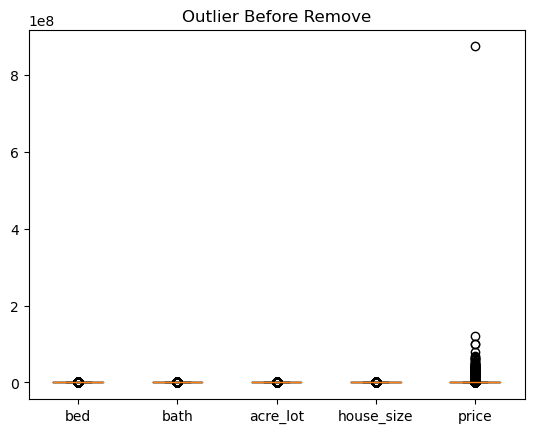

Total Row With Outlier: 104613


In [21]:
column_num = ['bed','bath','acre_lot','house_size','price']
plt.boxplot(df[column_num])
plt.xticks([1, 2, 3, 4, 5], column_num)
plt.title('Outlier Before Remove')
plt.show()
print(f'Total Row With Outlier: {df.shape[0]}')

In [22]:
Q1 = df[column_num].quantile(0.25)
Q3 = df[column_num].quantile(0.75)
IQR = Q3 - Q1

df = df[~((df[column_num] < (Q1 - 1.5 * IQR)) | (df[column_num] > (Q3 + 1.5 * IQR))).any(axis=1)]

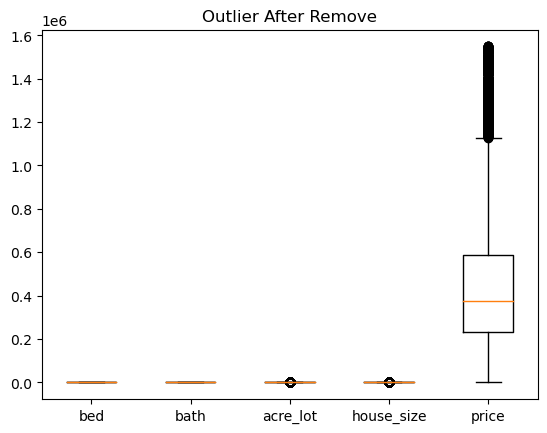

Total Row Without Outlier: 64990


In [23]:
column_num = ['bed','bath','acre_lot','house_size','price']
plt.boxplot(df[column_num])
plt.xticks([1, 2, 3, 4, 5], column_num)
plt.title('Outlier After Remove')
plt.show()
print(f'Total Row Without Outlier: {df.shape[0]}')

In [24]:
df.describe()

,price,bed,bath,acre_lot,zip_code,house_size
count,6.499000e+04,64990.000000,64990.000000,64990.000000,64990.000000,64990.000000
mean,4.410280e+05,3.061456,2.141160,0.262880,8449.074073,1504.325158
std,2.985229e+05,0.801975,0.797052,0.295712,5050.843197,556.317562
min,0.000000e+00,2.000000,1.000000,0.000000,601.000000,100.000000
25%,2.299000e+05,3.000000,2.000000,0.110000,6070.000000,1200.000000
50%,3.750000e+05,3.000000,2.000000,0.120000,7860.000000,1222.000000
75%,5.890000e+05,4.000000,3.000000,0.300000,10033.000000,1791.750000
max,1.549000e+06,5.000000,4.000000,1.430000,95652.000000,3330.000000


# EXPLORATORY DATA ANALYSIS

C:\Users\DELL\AppData\Local\Temp\ipykernel_23756\488824891.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr(),


<function matplotlib.pyplot.show(close=None, block=None)>

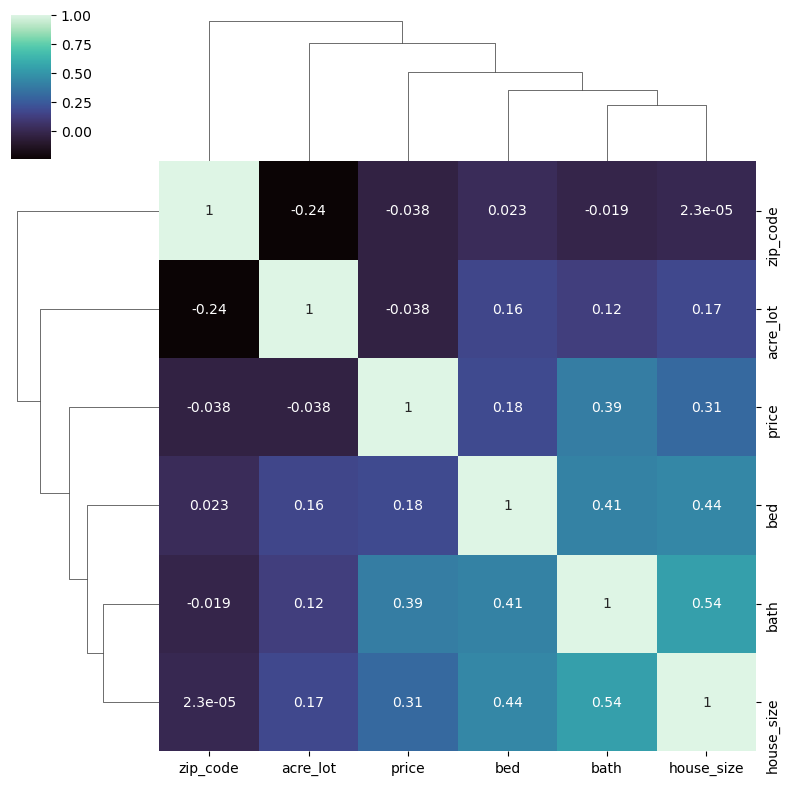

In [25]:
sns.clustermap(
    df.corr(),
    annot=True,
    cmap='mako',
    figsize=(8, 8)
)
plt.show

**DISTRIBUTION BY BED**

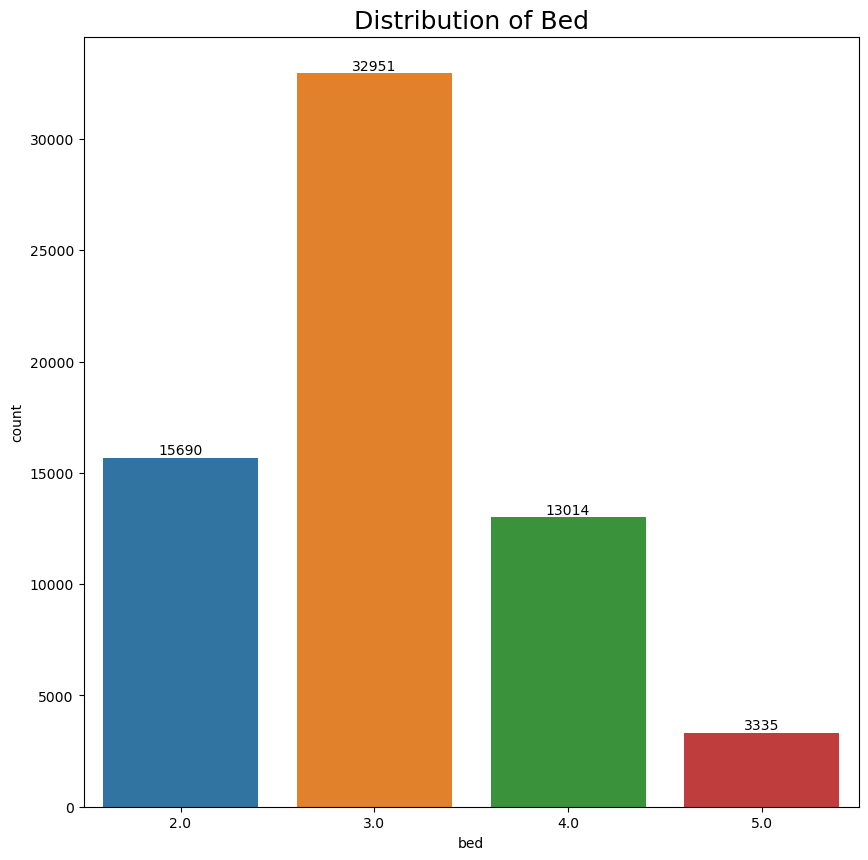

In [26]:
plt.figure(figsize=(10,10))
ax = sns.countplot(data=df, x='bed')
for i in ax.containers:
  ax.bar_label(i,)
plt.title('Distribution of Bed', fontsize=18)
plt.show()

**DISTRIBUTION BY BATH**

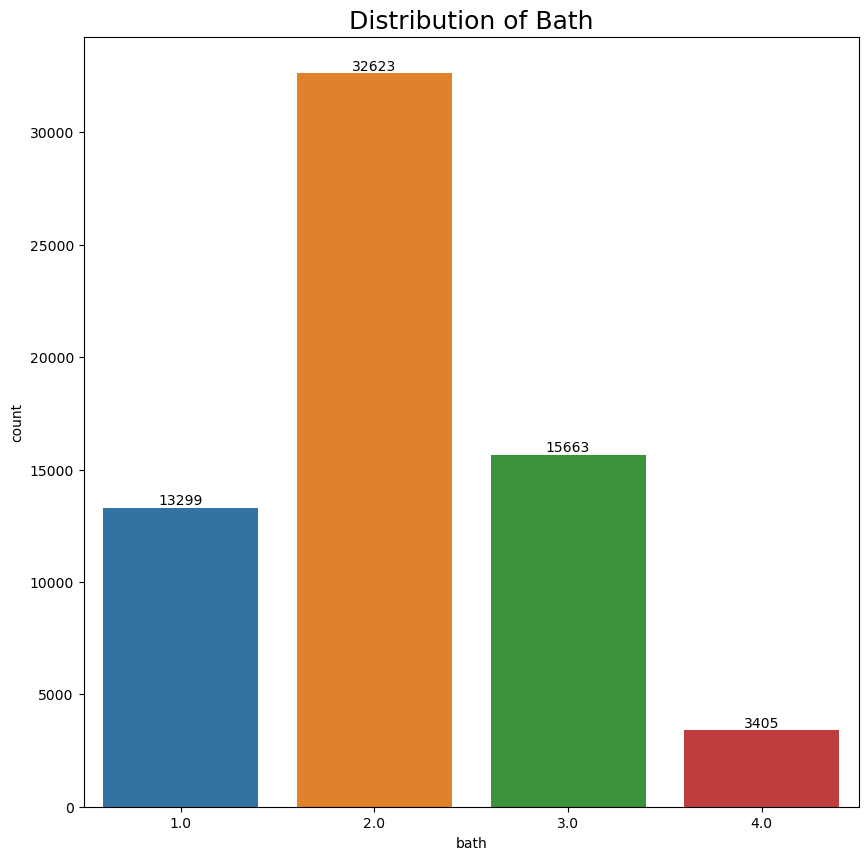

In [27]:
plt.figure(figsize=(10,10))
ax = sns.countplot(data=df, x='bath')
for i in ax.containers:
  ax.bar_label(i,)
plt.title('Distribution of Bath', fontsize=18)
plt.show()

**DISTRIBUTION OF BED AND BATH**

C:\Users\DELL\AppData\Local\Temp\ipykernel_23756\4155772061.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  pivot = grouped.pivot('bed', 'bath', 'count')


<Axes: xlabel='bath', ylabel='bed'>

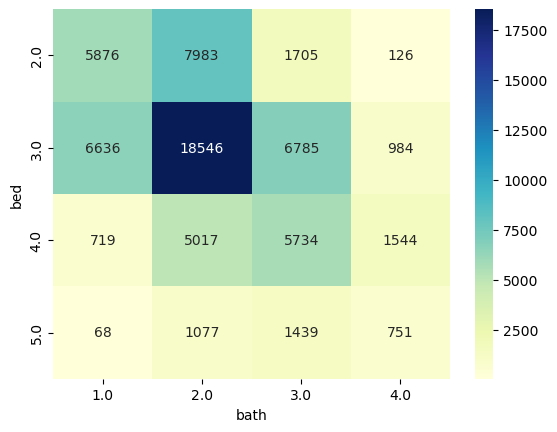

In [30]:
grouped = df.groupby(['bed', 'bath']).size().reset_index(name='count')

pivot = grouped.pivot('bed', 'bath', 'count')

sns.heatmap(pivot, cmap='YlGnBu', annot=True, fmt='g')

**DISTRIBUTION OF ACRE LOT**

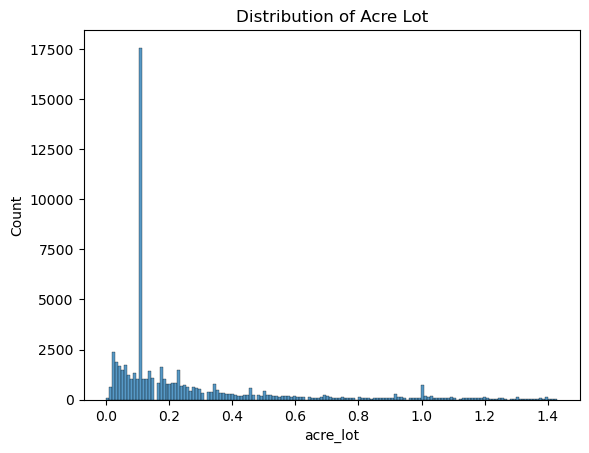

In [31]:
sns.histplot(data=df, x="acre_lot")
plt.title('Distribution of Acre Lot')
plt.show()

In [32]:
df['acre_lot'].value_counts()

0.11    17576
0.02     2366
0.03     1878
0.06     1721
0.04     1652
        ...  
1.33       37
1.35       34
1.41       33
1.36       31
1.43       26
Name: acre_lot, Length: 144, dtype: int64

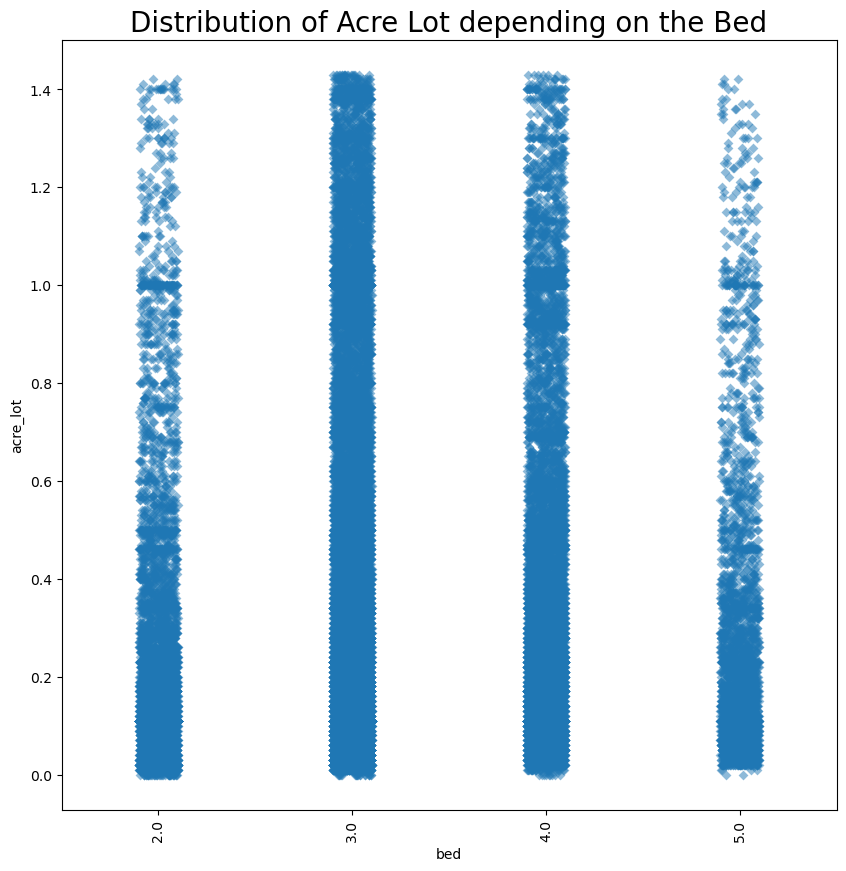

In [33]:
plt.subplots(figsize=(10,10))
plt.xticks(rotation=90)
sns.stripplot(y='acre_lot', x='bed', data=df, marker='D', alpha=0.5)
plt.title('Distribution of Acre Lot depending on the Bed',fontsize = 20)
plt.show()

In [34]:
df.groupby('bed', as_index=False).agg({'acre_lot' : 'count'}).sort_values('bed', ascending=False)

,bed,acre_lot
3,5.0,3335
2,4.0,13014
1,3.0,32951
0,2.0,15690


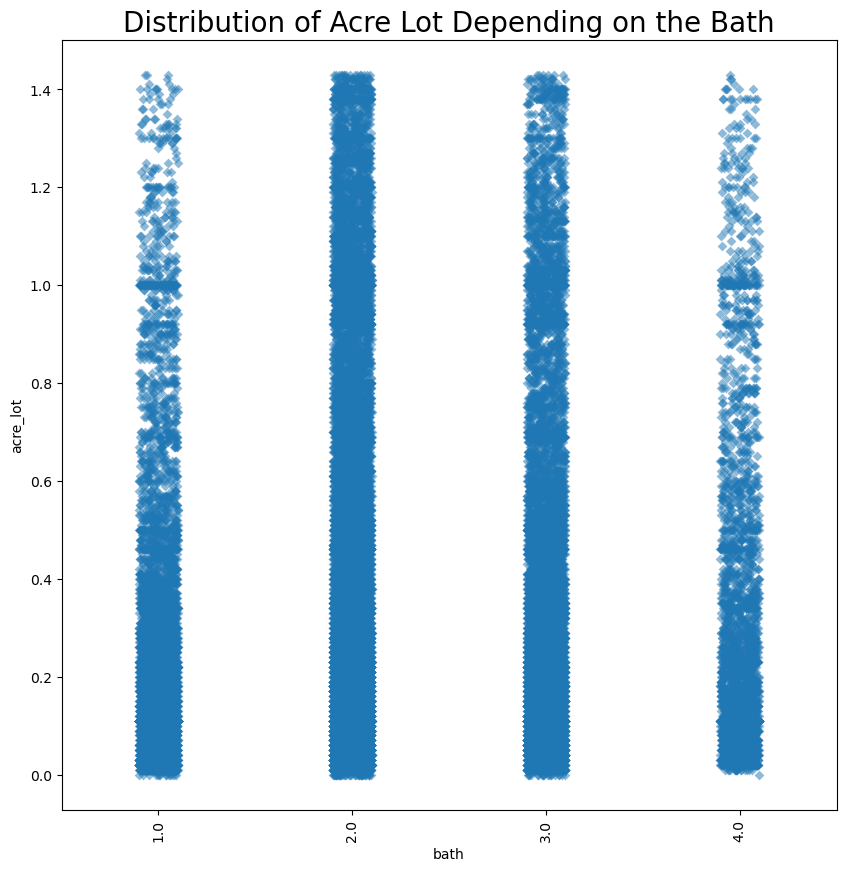

In [35]:
plt.subplots(figsize=(10,10))
plt.xticks(rotation=90)
sns.stripplot(y='acre_lot', x='bath', data=df, marker='D', alpha=0.5)
plt.title('Distribution of Acre Lot Depending on the Bath',fontsize = 20)
plt.show()

In [36]:
df.groupby('bath', as_index=False).agg({'acre_lot' : 'count'}).sort_values('bath', ascending=False)

,bath,acre_lot
3,4.0,3405
2,3.0,15663
1,2.0,32623
0,1.0,13299


**DISTRIBUTION OF THE CITY**

In [37]:
City = df['city'].value_counts().reset_index().rename(columns={'index': 'city', 'city': 'count'})
top_5 = City[:5]
fig = px.bar(top_5,'city', y='count', color='city', template='plotly')
fig.update_layout(title='Distribution of Top 5 Cities with Most Houses')
fig.update_traces(texttemplate='%{y:.}', textposition='outside')
fig.show()

In [40]:
df_mean = df.groupby('city')[['bed', 'bath']].mean().reset_index()

df_mean_sort = df_mean.sort_values(by=['bed', 'bath'], ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y=['bed', 'bath'], barmode='group',
             color_discrete_sequence=['blue', 'orange'],
             labels={'value': 'Mean Bed and Bath'},
             title='Top 10 Cities with Highest Mean Bed and Bath')
fig.show()

In [41]:
top10 = df.groupby('city')['acre_lot'].sum().nlargest(10).reset_index()

fig = px.bar(top10, x='city', y='acre_lot',color='city', template='plotly',
             title='Top 10 Cities with Highest Most Acre Lot') 
fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
fig.show()


**DISTRIBUTION OF THE STATE**

In [43]:
fig = px.histogram(df, x='state', nbins=25, color='state', template='plotly')
fig.update_layout(title='Distribution of State')
fig.show()

**DISTRIBUTION OF HOUSE SIZE**

In [49]:
fig = px.histogram(df, x='house_size', nbins=20)
fig.update_layout(title='Distribution of House Size')
fig.show()

In [50]:
df['house_size'].value_counts()

1200.0    18835
1000.0      377
1500.0      349
1100.0      343
1600.0      303
          ...  
659.0         1
574.0         1
486.0         1
511.0         1
199.0         1
Name: house_size, Length: 2914, dtype: int64

In [58]:
df_mean = df.groupby('acre_lot')['house_size'].mean().reset_index()

fig = px.scatter(df_mean, x='acre_lot', y='house_size', title='Average House Size by Acre Lot',trendline='ols')
fig.show()

In [59]:
df_mean = df.groupby('city')['house_size'].mean().reset_index()
df_mean_sort = df_mean.sort_values(by='house_size', ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y='house_size', color='house_size',
             color_continuous_scale='RdYlBu_r')
fig.update_layout(title='Top 10 Cities with Highest Mean House Size',
                  xaxis_title='City', yaxis_title='Mean House Size')
fig.update_traces(texttemplate='%{y:.2f}', textposition='outside')
fig.show()




In [60]:
df.groupby('city', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,city,house_size
271,Cambridge Village,3289.000000
1614,Rye Brook,3282.000000
107,Bay Head,3200.000000
1778,Stanfordville,3171.000000
479,Doylestown,3145.000000
...,...,...
65,Athens,602.000000
1409,Passadumkeag,576.000000
297,Casco,570.454545
1233,Narrowsburg,537.000000


In [61]:
df_mean = df.groupby('state')['house_size'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='house_size', ascending=False)

fig = px.bar(df_mean_sort, x='state', y='house_size', color='state')
fig.update_layout(title='Top 10 States with Highest Average House Size',
                  xaxis_title='State',
                  yaxis_title='Average House Size (sqft)')
fig.update_traces(texttemplate='%{y:.1f}', textposition='outside')
fig.show()

In [62]:
df.groupby('state', as_index=False).agg({'house_size' : 'mean'}).sort_values('house_size', ascending=False)

,state,house_size
2,Georgia,2477.333333
17,Wyoming,1935.000000
16,West Virginia,1860.000000
1,Delaware,1794.259193
0,Connecticut,1622.581930
5,New Hampshire,1622.286523
4,Massachusetts,1604.887002
13,Vermont,1583.470889
10,Rhode Island,1554.584713
8,Pennsylvania,1535.804904


**DISTRIBUTION OF PRICE**

In [63]:
fig = px.histogram(df, x="price", nbins=25, template="plotly")
fig.update_layout(title="Distribution of Price")
fig.show()

In [64]:
df['price'].value_counts()

325000.0     569
425000.0     567
350000.0     559
299900.0     552
499000.0     538
            ... 
384990.0       1
1449990.0      1
31499.0        1
149350.0       1
677590.0       1
Name: price, Length: 4566, dtype: int64

In [65]:
fig = px.histogram(df, x="price", color="bed", nbins=20)
fig.update_layout(title="Distribution of Price by Bed", xaxis_title="Price", yaxis_title="Count")
fig.show()

In [66]:
df.groupby('bed', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,bed,price
3,5.0,614042.032084
2,4.0,545183.319348
0,2.0,420963.774634
1,3.0,391934.743194


In [67]:
fig = px.histogram(df, x="price", color="bath", nbins=20)
fig.update_layout(title="Distribution of Price by Bath", xaxis_title="Price", yaxis_title="Count")
fig.show()

In [68]:
df.groupby('bath', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,bath,price
3,4.0,764841.111307
2,3.0,580936.540893
1,2.0,391836.743371
0,1.0,314010.537559


In [69]:
df_mean = df.groupby('acre_lot')['price'].mean().reset_index()

# plot mean price per acre lot
fig = px.scatter(df_mean, x='acre_lot', y='price', trendline='ols')
fig.update_layout(title='Average Price per Acre Lot', xaxis_title='Acre Lot', yaxis_title='Price')
fig.show()

In [70]:
df_mean = df.groupby('city')['price'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='price', ascending=False)

top10 = df_mean_sort.head(10)

fig = px.bar(top10, x='city', y='price', color='city',
             labels={'city': 'City', 'price': 'Mean Price'},
             title='Top 10 Cities with the Highest Average Price')
fig.update_traces(texttemplate='%{y:.1f}', textposition='outside')
fig.show()

In [71]:
df.groupby('city', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,city,price
107,Bay Head,1.499500e+06
1241,Neponsit,1.440000e+06
840,Hollis Hills,1.422333e+06
32,Alpine,1.400000e+06
206,Breezy Point,1.399000e+06
...,...,...
977,Lehman,1.347500e+04
1004,Linneus,1.250000e+04
127,Beekmantown,1.090000e+04
238,Brookton,9.900000e+03


In [72]:
df_mean = df.groupby('state')['price'].mean().reset_index()

df_mean_sort = df_mean.sort_values(by='price', ascending=False)

fig = px.bar(df_mean_sort, x='state', y='price',
             title='Top 10 States with Highest Mean Price',
             labels={'state': 'State', 'price': 'Mean Price'})
fig.update_traces(texttemplate='%{y:.1f}', textposition='outside')
fig.show()

In [73]:
df.groupby('state', as_index=False).agg({'price' : 'mean'}).sort_values('price', ascending=False)

,state,price
7,New York,669470.742851
4,Massachusetts,564020.906003
15,Virginia,555571.428571
17,Wyoming,535000.000000
6,New Jersey,444524.188595
10,Rhode Island,424223.772824
2,Georgia,372310.000000
5,New Hampshire,366134.448471
0,Connecticut,361536.831495
8,Pennsylvania,324494.692644


In [74]:
df_mean = df.groupby('price')['house_size'].mean().reset_index()

fig = px.scatter(df_mean, x='price', y='house_size', trendline='ols', 
                 labels={'price':'Price', 'house_size':'Mean House Size'})
fig.update_layout(title='Distribution of Mean House Size by Price')
fig.show()

Analysis concluded

**MODEL PREDICTING House Price**

In [76]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV, ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [77]:
df['house_size'] = StandardScaler().fit_transform(df['house_size'].values.reshape(len(df), 1))
df['price'] = StandardScaler().fit_transform(df['price'].values.reshape(len(df), 1))

C:\Users\DELL\AppData\Local\Temp\ipykernel_23756\3504026565.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\DELL\AppData\Local\Temp\ipykernel_23756\3504026565.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [78]:
df['bed'] = MinMaxScaler().fit_transform(df['bed'].values.reshape(len(df), 1))
df['bath'] = MinMaxScaler().fit_transform(df['bath'].values.reshape(len(df), 1))
df['acre_lot'] = MinMaxScaler().fit_transform(df['acre_lot'].values.reshape(len(df), 1))

C:\Users\DELL\AppData\Local\Temp\ipykernel_23756\3635949612.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\DELL\AppData\Local\Temp\ipykernel_23756\3635949612.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\DELL\AppData\Local\Temp\ipykernel_23756\3635949612.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

In [79]:
df.head()

,status,price,bed,bath,acre_lot,city,state,zip_code,house_size
0,for_sale,-1.125644,0.333333,0.333333,0.083916,Adjuntas,Puerto Rico,601.0,-1.050353
1,for_sale,-1.209391,0.666667,0.333333,0.055944,Adjuntas,Puerto Rico,601.0,0.040759
2,for_sale,-1.252939,0.000000,0.000000,0.104895,Juana Diaz,Puerto Rico,795.0,-1.359531
3,for_sale,-0.991650,0.666667,0.333333,0.069930,Ponce,Puerto Rico,731.0,0.531490
5,for_sale,-0.877755,0.666667,0.666667,0.321678,San Sebastian,Puerto Rico,612.0,1.825725


In [80]:
X = df[['bed', 'bath', 'acre_lot', 'zip_code', 'house_size', 'city', 'state']]
y = df['price']


X = pd.get_dummies(X, columns=['city', 'state'])


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [81]:
# Desision Tree Regressor
model_DT = DecisionTreeRegressor(max_depth=5)


model_DT.fit(X_train, y_train)


y_pred = model_DT.predict(X_test)


mse_DT = mean_squared_error(y_test, y_pred)
rmse_DT = mean_squared_error(y_test, y_pred, squared=False)
mae_DT = mean_absolute_error(y_test, y_pred)
r2_DT = r2_score(y_test, y_pred)

In [82]:
#RandomForest Regressor
model_RF = RandomForestRegressor(n_estimators=100, random_state=42)
model_RF.fit(X_train, y_train)


y_pred = model_RF.predict(X_test)


mse_RF = mean_squared_error(y_test, y_pred)
rmse_RF = mean_squared_error(y_test, y_pred, squared=False)
mae_RF = mean_absolute_error(y_test, y_pred)
r2_RF = r2_score(y_test, y_pred)

In [83]:
#Gradient Boost Regressor
model_GD = GradientBoostingRegressor(learning_rate=0.05,
    n_estimators=150,
    max_depth=3,
    min_samples_split=4,
    min_samples_leaf=1)
model_GD.fit(X_train, y_train)


y_pred = model_GD.predict(X_test)


mse_GD = mean_squared_error(y_test, y_pred)
rmse_GD = mean_squared_error(y_test, y_pred, squared=False)
mae_GD = mean_absolute_error(y_test, y_pred)
r2_GD = r2_score(y_test, y_pred)

In [84]:
#Ridge CV
ridge_cv_model = RidgeCV(alphas=(1.38), scoring='neg_mean_absolute_error')
ridge_cv_model.fit(X_train, y_train)

y_pred = ridge_cv_model.predict(X_test)

mse_R = mean_squared_error(y_test, y_pred)
rmse_R = mean_squared_error(y_test, y_pred, squared=False)
mae_R = mean_absolute_error(y_test, y_pred)
r2_R = r2_score(y_test, y_pred)

In [85]:
#Elastic Net CV
elastic_model = ElasticNetCV(l1_ratio=[0.01], tol=0.01)
elastic_model.fit(X_train, y_train)

y_pred = elastic_model.predict(X_test)

mse_E = mean_squared_error(y_test, y_pred)
rmse_E = mean_squared_error(y_test, y_pred, squared=False)
mae_E = mean_absolute_error(y_test, y_pred)
r2_E = r2_score(y_test, y_pred)

In [86]:
results = {
    'Decision Tree': {'MSE': mse_DT, 'RMSE': rmse_DT, 'MAE': mae_DT, 'R^2': r2_DT},
    'Random Forest': {'MSE': mse_RF, 'RMSE': rmse_RF, 'MAE': mae_RF, 'R^2': r2_RF},
    'Gradient Boosting': {'MSE': mse_GD, 'RMSE': rmse_GD, 'MAE': mae_GD, 'R^2': r2_GD},
    'Ridge CV': {'MSE': mse_R, 'RMSE': rmse_R, 'MAE': mae_R, 'R^2': r2_R},
    'ElasticNet CV': {'MSE': mse_E, 'RMSE': rmse_E, 'MAE': mae_E, 'R^2': r2_E}
}

data = pd.DataFrame.from_dict(results, orient='index')
data = data.applymap(lambda x: f'{x:.2f}')

print(data)

                    MSE  RMSE   MAE   R^2
Decision Tree      0.57  0.76  0.55  0.43
Random Forest      0.29  0.53  0.34  0.71
Gradient Boosting  0.47  0.68  0.49  0.53
Ridge CV           0.38  0.62  0.44  0.62
ElasticNet CV      1.00  1.00  0.76  0.01
